### CONNECTING TO THE GDRIVE

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### IMPORTING LIBRARIES

In [2]:
import tensorflow as tf
import numpy as np 
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tensorflow.keras.layers import Conv2D,MaxPool2D,Dropout,UpSampling2D,Concatenate,Input,Softmax, BatchNormalization, LeakyReLU, Add, Conv2DTranspose, Dropout, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications.efficientnet import EfficientNetB4
from tensorflow.keras.models import Model

### INITIALIZING VARIABLES

In [3]:
EPOCHS=20
batch=10
HEIGHT=256
WIDTH=256
CLASSES=13

### UTILITY FUNCTIONS FOR IMAGE MASKING

In [4]:
# This function splits the input image into two parts namely the original and masked image.
def ImageLoading(name, path):
    img = Image.open(os.path.join(path, name))
    img = np.array(img)
    originl_image = img[:,:256]
    masked_image = img[:,256:]
    return originl_image, masked_image

In [5]:
# Image Binning. This helps to provide better low-light performance at the expense of some image resolution and increase the frame rate.
def binning(mask):
    bins = np.array([10, 20, 30, 50, 80, 90, 100, 120, 150, 200, 220, 240])
    new_masked_image = np.digitize(mask, bins)
    return new_masked_image

In [6]:
# Finding the Segmentation Array
def SegmentationArr(image, classes, w=WIDTH, h=HEIGHT):
    labels = np.zeros((h, w, classes))
    img = image[:, : , 0]

    for c in range(classes):
        labels[:, :, c] = (img == c ).astype(int)
    return labels

In [7]:
# Segment Colouring. Assigning colors to the Segments obtained
def segment_colouring(seg, n_classes=CLASSES):
    
    seg_img = np.zeros( (seg.shape[0],seg.shape[1],3) ).astype('float')
    colors = sns.color_palette("husl", n_classes)
    
    for c in range(n_classes):
        segc = (seg == c)
        seg_img[:,:,0] += (segc*( colors[c][0] )) #R
        seg_img[:,:,1] += (segc*( colors[c][1] )) #G
        seg_img[:,:,2] += (segc*( colors[c][2] )) #B

    return(seg_img)

classes = 13

### DATASET LOADING

In [8]:
# Loading the cityscapes dataset from the google drive folder
train ='/content/drive/MyDrive/train/'
valid ='/content/drive/MyDrive/val/'

In [9]:
# Counting the number of samples 
training_samples = len(os.listdir(train)) 
valid_samples = len(os.listdir(valid))

In [10]:
# Loads data in batches for easy processing
def DataGenerator(path, batch_size=batch, classes=CLASSES):
    files = os.listdir(path)
    while True:
        for i in range(0, len(files), batch_size):
            batch_files = files[i : i+batch_size]
            images=[]
            segments=[]
            for file in batch_files:
                image, mask = ImageLoading(file, path)
                mask_binned = binning(mask)
                labels = SegmentationArr(mask_binned, classes)
                images.append(image)
                segments.append(labels)
            yield np.array(images), np.array(segments)

In [11]:
# Using DataGenerator for train & test dataset
datagen_train = DataGenerator(train, batch_size=batch)
datagen_val = DataGenerator(valid, batch_size=batch)

In [12]:
imgs, segs = next(datagen_train)
imgs.shape, segs.shape

((10, 256, 256, 3), (10, 256, 256, 13))

### DISPLAYING SAMPLE DATASET IMAGES

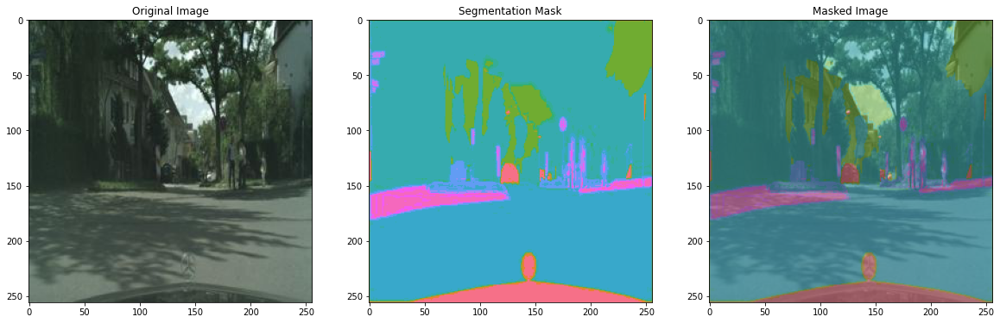

In [13]:
image = imgs[3]
mask = segment_colouring(np.argmax(segs[3], axis=-1))
masked_image = cv2.addWeighted(image/255, 0.5, mask, 0.5, 0)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[1].imshow(mask)
axs[1].set_title('Segmentation Mask')
axs[2].imshow(masked_image)
axs[2].set_title('Masked Image')
plt.show()

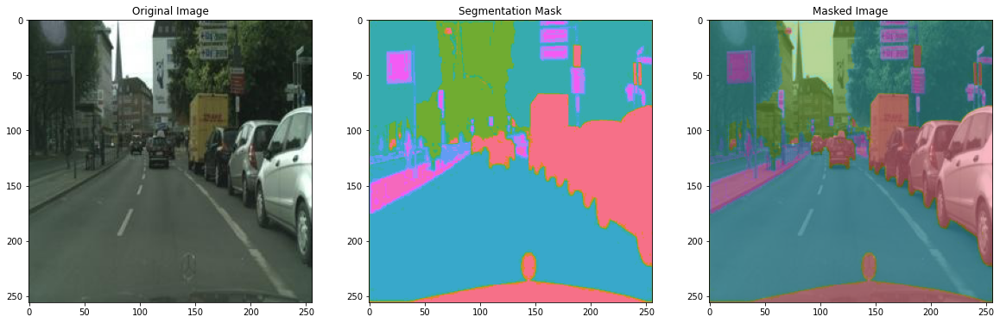

In [14]:
image = imgs[5]
mask = segment_colouring(np.argmax(segs[5], axis=-1))
masked_image = cv2.addWeighted(image/255, 0.5, mask, 0.5, 0)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[1].imshow(mask)
axs[1].set_title('Segmentation Mask')
axs[2].imshow(masked_image)
axs[2].set_title('Masked Image')
plt.show()

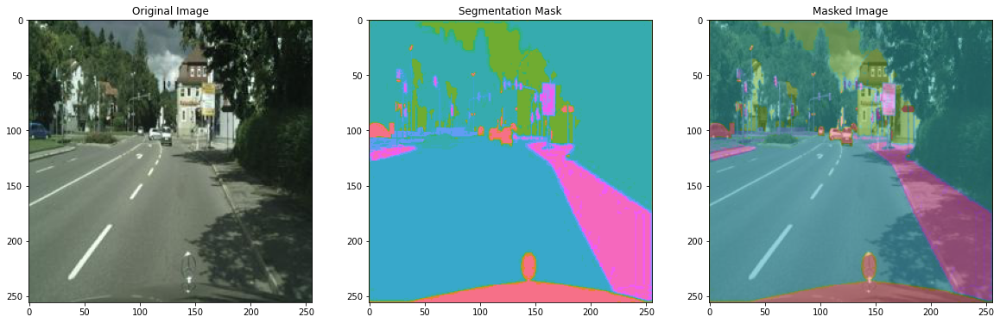

In [15]:
image = imgs[8]
mask = segment_colouring(np.argmax(segs[8], axis=-1))
masked_image = cv2.addWeighted(image/255, 0.5, mask, 0.5, 0)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[1].imshow(mask)
axs[1].set_title('Segmentation Mask')
axs[2].imshow(masked_image)
axs[2].set_title('Masked Image')
plt.show()

### MODEL 1 - UNET

In [16]:
def down_sampling(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(conv)
    pool = MaxPool2D((2, 2), (2, 2))(conv)
    return conv, pool

In [17]:
def bridge(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(conv)
    return conv

In [18]:
def up_sampling(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = UpSampling2D((2, 2))(x)
    concat = Concatenate()([us, skip])
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(concat)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(conv)
    return conv

In [19]:
def UNET():
    i = Input((HEIGHT,WIDTH,3))
    
    input = i
    conv1, pool1 = down_sampling(input, 16) #128 -> 64
    conv2, pool2 = down_sampling(pool1, 32) #64 -> 32
    conv3, pool3 = down_sampling(pool2, 64) #32 -> 16
    conv4, pool4 = down_sampling(pool3, 128) #16->8
    
    b = bridge(pool4, 256)
    
    u1 = up_sampling(b, conv4, 128) #8 -> 16
    u2 = up_sampling(u1, conv3, 64) #16 -> 32
    u3 = up_sampling(u2, conv2, 32) #32 -> 64
    u4 = up_sampling(u3, conv1, 16) #64 -> 128
    
    output = Conv2D(13, (1, 1), padding="same", activation="sigmoid")(u4)
    model = Model(input, output)
    return model

In [20]:
model1 = UNET()
model1.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["acc"])
model1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 16  2320        ['conv2d[0][0]']                 
                                )                                                             

In [21]:
checkpoint1 = ModelCheckpoint('seg_model_unet.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')

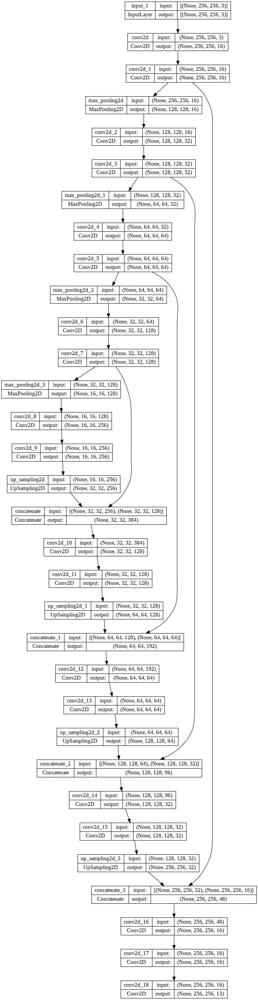

In [22]:
tf.keras.utils.plot_model(model1, show_shapes = True)

In [23]:
TRAIN_STEPS = training_samples//batch+1
VAL_STEPS = valid_samples//batch+1

In [24]:
history1 = model1.fit(datagen_train, validation_data=datagen_val, steps_per_epoch=TRAIN_STEPS, validation_steps=VAL_STEPS, epochs=EPOCHS, callbacks = checkpoint1)

Epoch 1/20
298/298 [==============================] - ETA: 0s - loss: 1.4904 - acc: 0.5656
Epoch 1: val_acc improved from -inf to 0.68304, saving model to seg_model_unet.hdf5
298/298 [==============================] - 115s 348ms/step - loss: 1.4904 - acc: 0.5656 - val_loss: 1.1389 - val_acc: 0.6830
Epoch 2/20
298/298 [==============================] - ETA: 0s - loss: 1.0318 - acc: 0.7042
Epoch 2: val_acc improved from 0.68304 to 0.71963, saving model to seg_model_unet.hdf5
298/298 [==============================] - 62s 209ms/step - loss: 1.0318 - acc: 0.7042 - val_loss: 0.9942 - val_acc: 0.7196
Epoch 3/20
298/298 [==============================] - ETA: 0s - loss: 0.9097 - acc: 0.7393
Epoch 3: val_acc improved from 0.71963 to 0.72839, saving model to seg_model_unet.hdf5
298/298 [==============================] - 61s 205ms/step - loss: 0.9097 - acc: 0.7393 - val_loss: 0.9514 - val_acc: 0.7284
Epoch 4/20
298/298 [==============================] - ETA: 0s - loss: 0.8359 - acc: 0.7606
Epoch

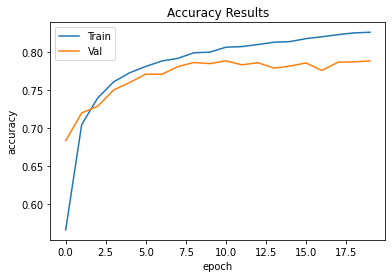

In [25]:
plt.plot(history1.history['acc'])
plt.plot(history1.history['val_acc'])
plt.title('Accuracy Results')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

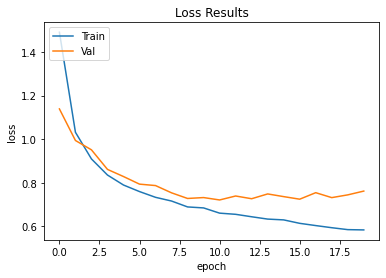

In [26]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('Loss Results')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

1/1 [==============================] - 0s 229ms/step


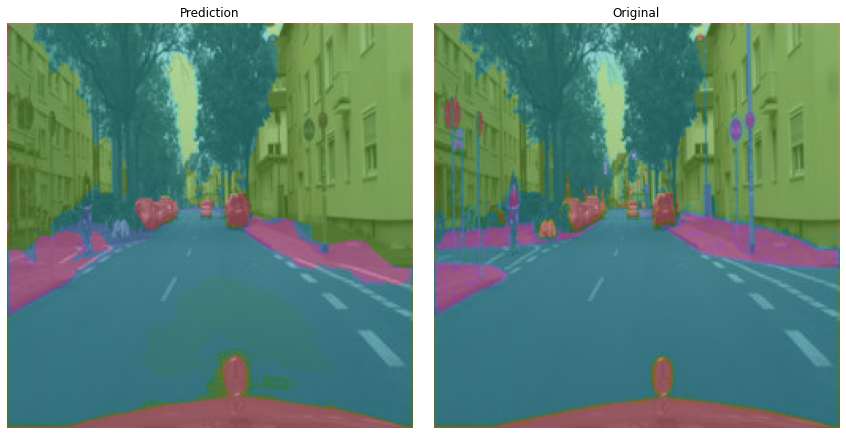

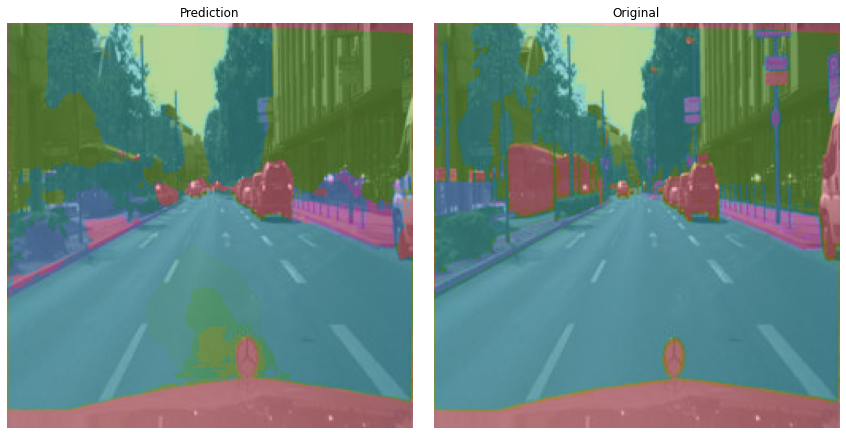

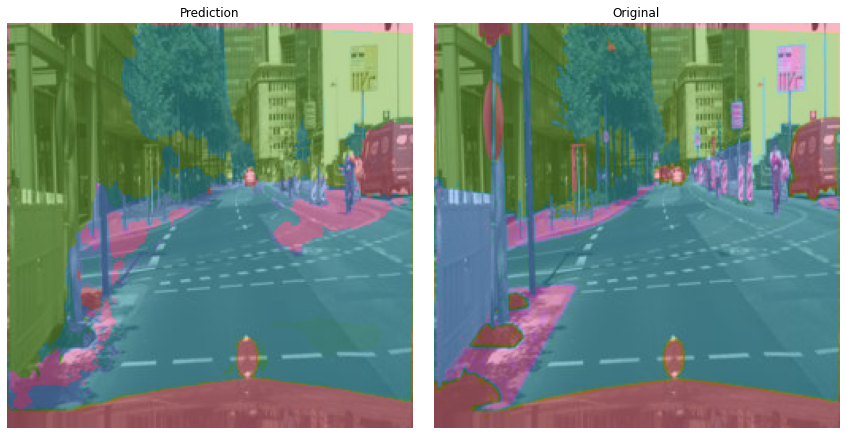

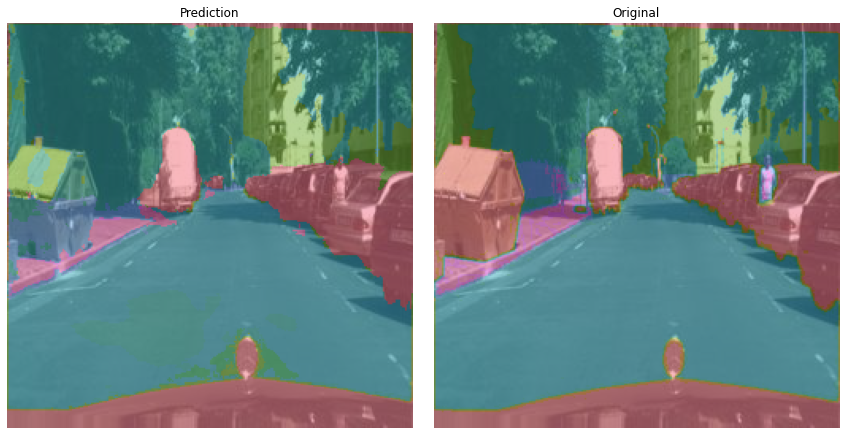

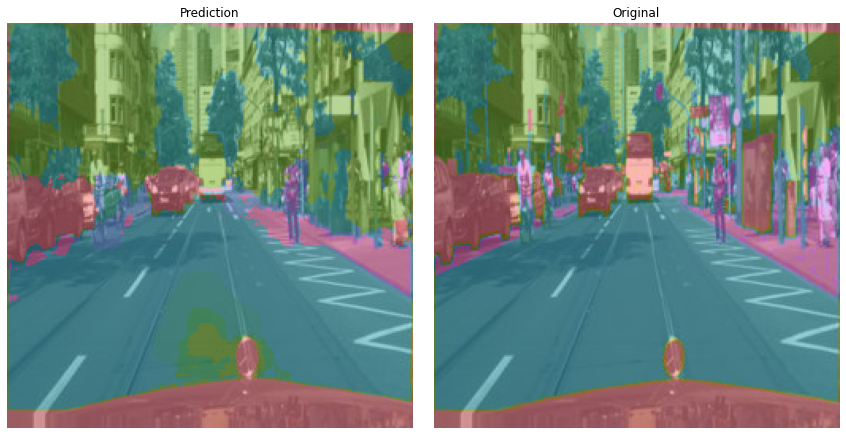

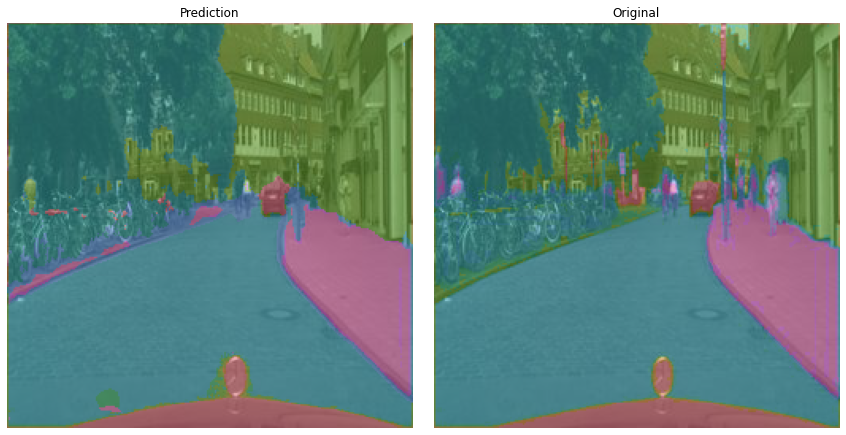

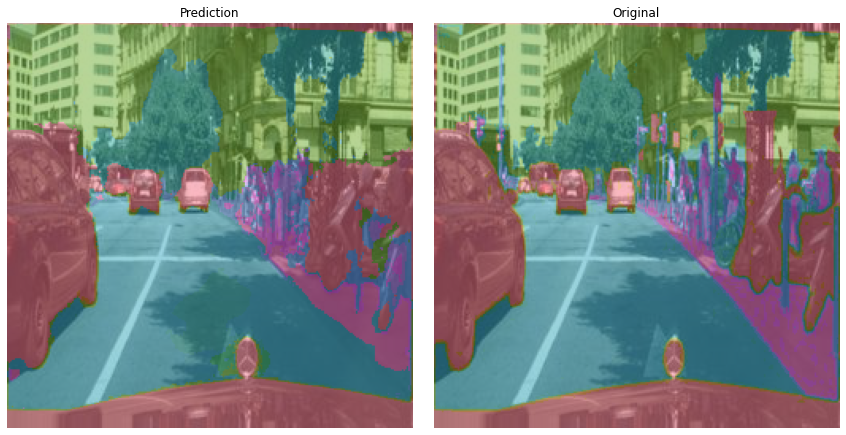

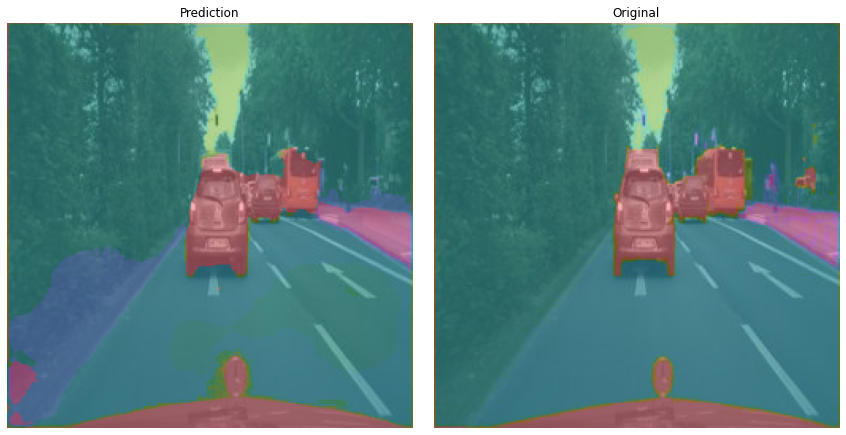

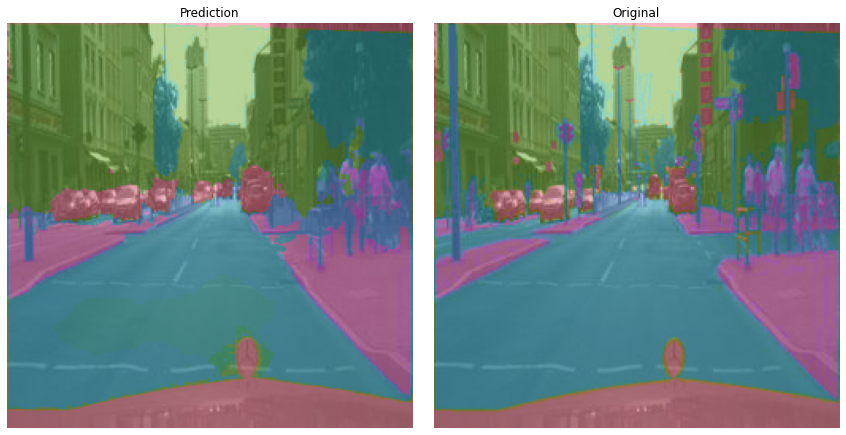

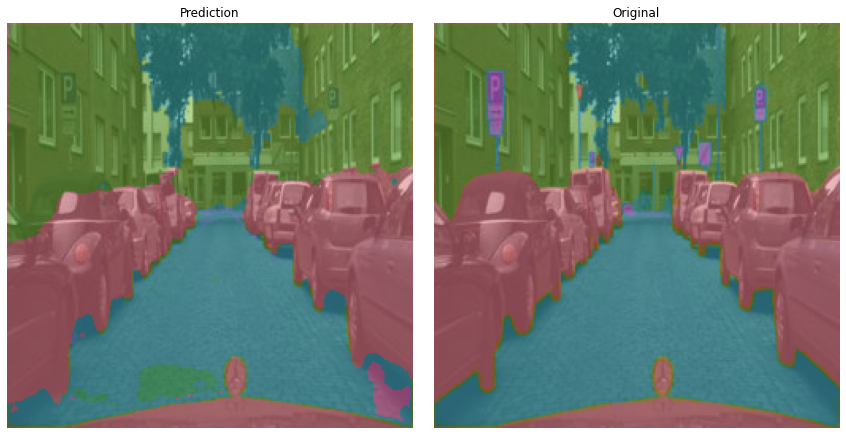

In [27]:
imgs, segs = next(datagen_val)
pred = model1.predict(imgs)

for i in range(10):
    _p = segment_colouring(np.argmax(pred[i], axis=-1))
    _s = segment_colouring(np.argmax(segs[i], axis=-1))

    predimg = cv2.addWeighted(imgs[i]/255, 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[i]/255, 0.5, _s, 0.5, 0)
    
    plt.figure(figsize=(12,6))
    plt.subplot(121)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    plt.subplot(122)
    plt.title("Original")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()

### MODEL 2 - UNET ++

In [28]:
from tensorflow.keras.layers import BatchNormalization, LeakyReLU, Add
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, Dropout, concatenate
from tensorflow.keras.applications.efficientnet import EfficientNetB4
from tensorflow.keras.models import Model

In [29]:
def conv_block(x, filters, size, strides=(1,1), padding='same', activation=True):
    c = Conv2D(filters, size, strides=strides, padding=padding)(x)
    c = BatchNormalization()(x)
    if activation == True:
        c = LeakyReLU(alpha=0.1)(x)
    return c

In [30]:
def res_block(blockInput, num_filters=16):
    r = LeakyReLU(alpha=0.3)(blockInput)
    r = BatchNormalization()(r)
    blockInput = BatchNormalization()(blockInput)
    r = conv_block(r, num_filters, (3,3))
    r = conv_block(r, num_filters, (3,3), activation=False)
    r = Add()([r, blockInput])
    return r

In [31]:
def UNETPP(input_shape=(None, None, 3),dropout_rate=0.01):

    backbone = EfficientNetB4(weights='imagenet',include_top=False,input_shape=input_shape)
    input = backbone.input
    initial_neurons = 8

    c4 = backbone.layers[323].output
    c4 = LeakyReLU(alpha=0.3)(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout_rate)(p4)
    
    # Middle
    cm = Conv2D(initial_neurons * 32, (3, 3), activation=None, padding="same",name='conv_middle')(p4)
    cm = res_block(cm,initial_neurons * 32)
    cm = res_block(cm,initial_neurons * 32)
    cm = LeakyReLU(alpha=0.3)(cm)   
    
    
    d4 = Conv2DTranspose(initial_neurons * 16, (3, 3), strides=(2, 2), padding="same")(cm)
    d4_up1 = Conv2DTranspose(initial_neurons * 16, (3, 3), strides=(2, 2), padding="same")(d4)
    d4_up2 = Conv2DTranspose(initial_neurons * 16, (3, 3), strides=(2, 2), padding="same")(d4_up1)
    d4_up3 = Conv2DTranspose(initial_neurons * 16, (3, 3), strides=(2, 2), padding="same")(d4_up2)
    
    #1st concat
    u4 = concatenate([d4, c4])
    u4 = Dropout(dropout_rate)(u4) 

    # Upsampling
    u4 = Conv2D(initial_neurons * 16, (3, 3), activation=None, padding="same")(u4)
    u4 = res_block(u4,initial_neurons * 16)
    u4 = LeakyReLU(alpha=0.3)(u4)
    
    # Downsampling
    d3 = Conv2DTranspose(initial_neurons * 8, (3, 3), strides=(2, 2), padding="same")(u4)
    d3_up1 = Conv2DTranspose(initial_neurons * 8, (3, 3), strides=(2, 2), padding="same")(d3)
    d3_up2 = Conv2DTranspose(initial_neurons * 8, (3, 3), strides=(2, 2), padding="same")(d3_up1)
    c3 = backbone.layers[146].output
    
    #2nd concat
    u3 = concatenate([d3,d4_up1, c3])    
    u3 = Dropout(dropout_rate)(u3)
    
    # Upsampling
    u3 = Conv2D(initial_neurons * 8, (3, 3), activation=None, padding="same")(u3)
    u3 = res_block(u3,initial_neurons * 8)
    u3 = LeakyReLU(alpha=0.3)(u3)

    # Downsampling
    d2 = Conv2DTranspose(initial_neurons * 4, (3, 3), strides=(2, 2), padding="same")(u3)
    d2_up1 = Conv2DTranspose(initial_neurons * 4, (3, 3), strides=(2, 2), padding="same")(d2)
    c2 = backbone.layers[87].output

    #3rd concat
    u2 = concatenate([d2,d3_up1,d4_up2, c2])
    u2 = Dropout(0.1)(u2)

    # Upsampling
    u2 = Conv2D(initial_neurons * 4, (3, 3), activation=None, padding="same")(u2)
    u2 = res_block(u2,initial_neurons * 4)
    u2 = LeakyReLU(alpha=0.3)(u2)
    
    # Downsampling
    d1 = Conv2DTranspose(initial_neurons * 2, (3, 3), strides=(2, 2), padding="same")(u2)
    c1 = backbone.layers[28].output
    
    #4th concat
    uc1 = concatenate([d1,d2_up1,d3_up2,d4_up3, c1])
    uc1 = Dropout(0.1)(uc1)

    # Upsampling
    uc1 = Conv2D(initial_neurons * 2, (3, 3), activation=None, padding="same")(uc1)
    uc1 = res_block(uc1,initial_neurons * 2)
    uc1 = LeakyReLU(alpha=0.3)(uc1)
    
    uc0 = Conv2DTranspose(initial_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uc1)   
    uc0 = Dropout(0.1)(uc0)
    uc0 = Conv2D(initial_neurons * 1, (3, 3), activation=None, padding="same")(uc0)
    uc0 = res_block(uc0,initial_neurons * 1)
    uc0 = LeakyReLU(alpha=0.3)(uc0)
    
    uc0 = Dropout(dropout_rate/2)(uc0)
    output = Conv2D(13, (1,1), padding="same", activation="sigmoid")(uc0)
    
    model = Model(input, output)

    return model

In [32]:
model2 = UNETPP()
model2.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["acc"])
model2.summary()

71686520/71686520 [==============================] - 4s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 rescaling (Rescaling)          (None, None, None,   0           ['input_2[0][0]']                
                                3)                                                                
                                                                                                  
 normalization (Normalization)  (None, None, None,   7           ['rescaling[0][0]']              
                           

In [33]:
checkpoint2 = ModelCheckpoint('seg_model_unetpp.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')

In [34]:
tf.keras.utils.plot_model(model2, show_shapes = True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.75985 to fit



In [35]:
history2 = model2.fit(datagen_train, validation_data=datagen_val, steps_per_epoch=TRAIN_STEPS, 
                    validation_steps=VAL_STEPS, epochs=EPOCHS, callbacks = checkpoint2)

Epoch 1/20
298/298 [==============================] - ETA: 0s - loss: 1.2371 - acc: 0.6777
Epoch 1: val_acc improved from -inf to 0.76585, saving model to seg_model_unetpp.hdf5
298/298 [==============================] - 149s 444ms/step - loss: 1.2371 - acc: 0.6777 - val_loss: 0.8602 - val_acc: 0.7658
Epoch 2/20
298/298 [==============================] - ETA: 0s - loss: 0.7954 - acc: 0.7800
Epoch 2: val_acc improved from 0.76585 to 0.78378, saving model to seg_model_unetpp.hdf5
298/298 [==============================] - 128s 430ms/step - loss: 0.7954 - acc: 0.7800 - val_loss: 0.7551 - val_acc: 0.7838
Epoch 3/20
298/298 [==============================] - ETA: 0s - loss: 0.7164 - acc: 0.7940
Epoch 3: val_acc improved from 0.78378 to 0.78796, saving model to seg_model_unetpp.hdf5
298/298 [==============================] - 128s 430ms/step - loss: 0.7164 - acc: 0.7940 - val_loss: 0.7209 - val_acc: 0.7880
Epoch 4/20
298/298 [==============================] - ETA: 0s - loss: 0.6687 - acc: 0.80

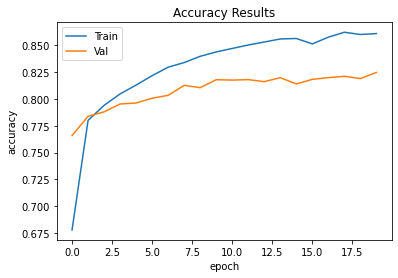

In [36]:
plt.plot(history2.history['acc'])
plt.plot(history2.history['val_acc'])
plt.title('Accuracy Results')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

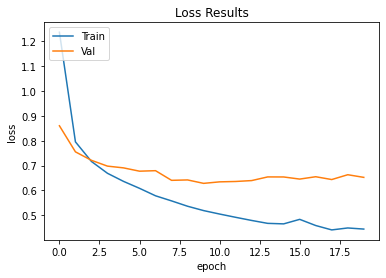

In [37]:
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('Loss Results')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

1/1 [==============================] - 2s 2s/step


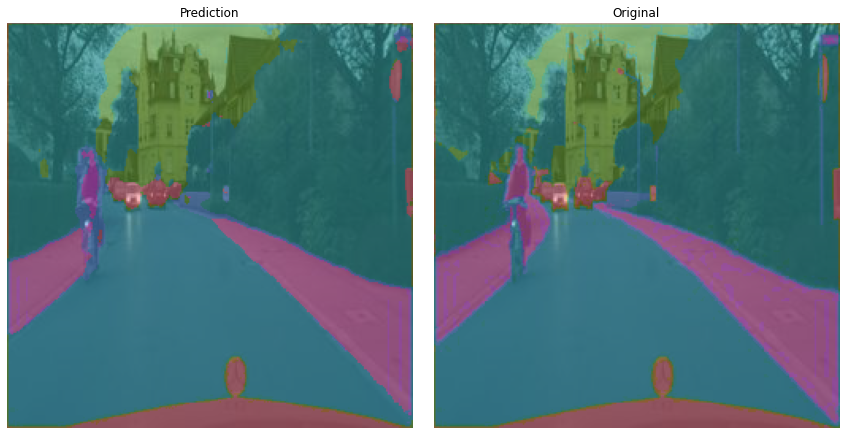

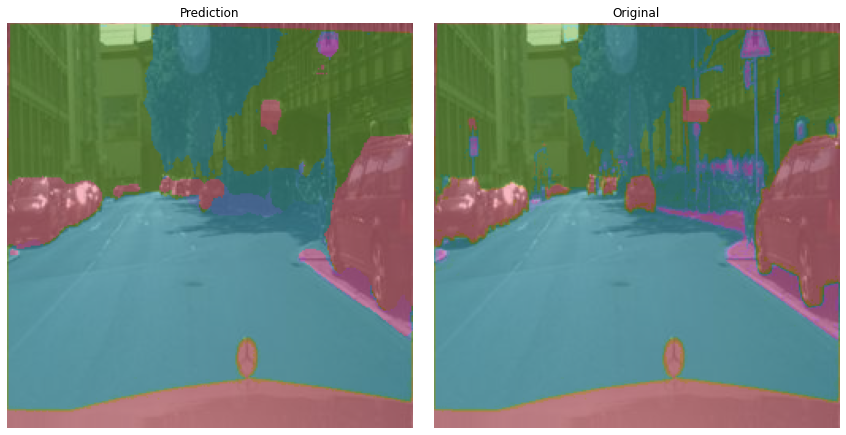

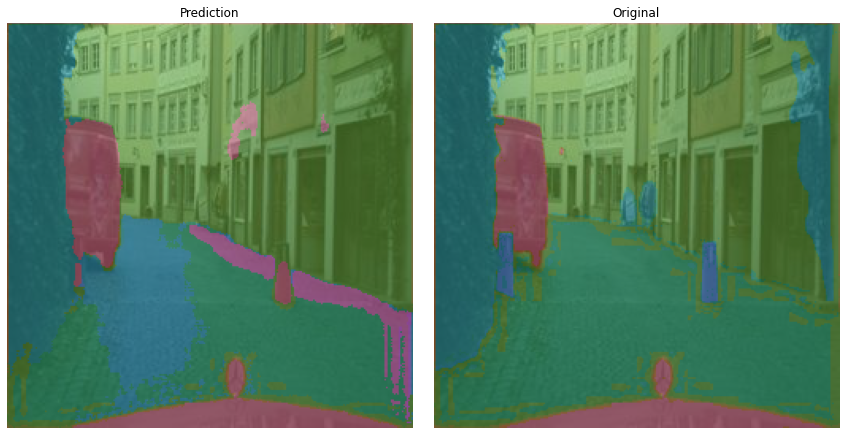

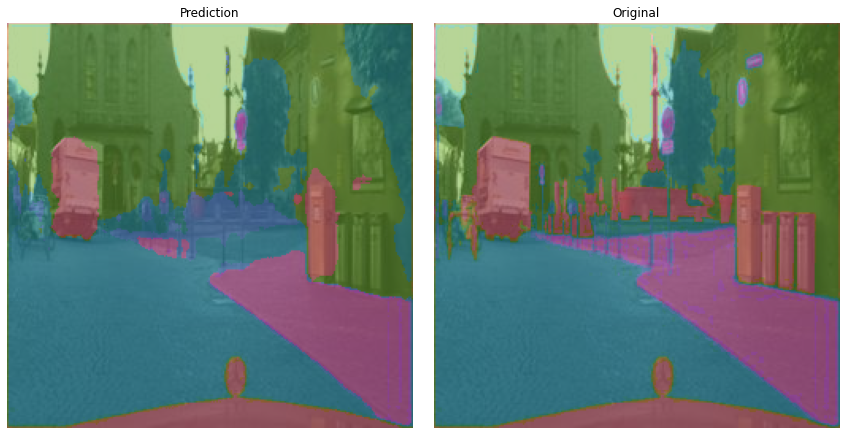

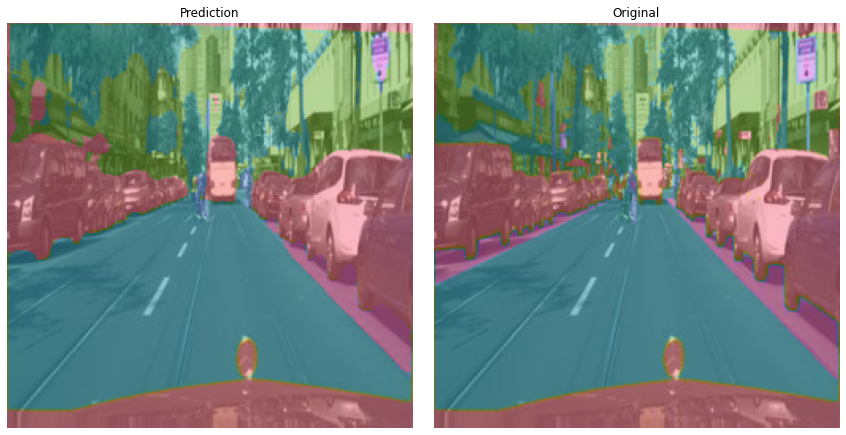

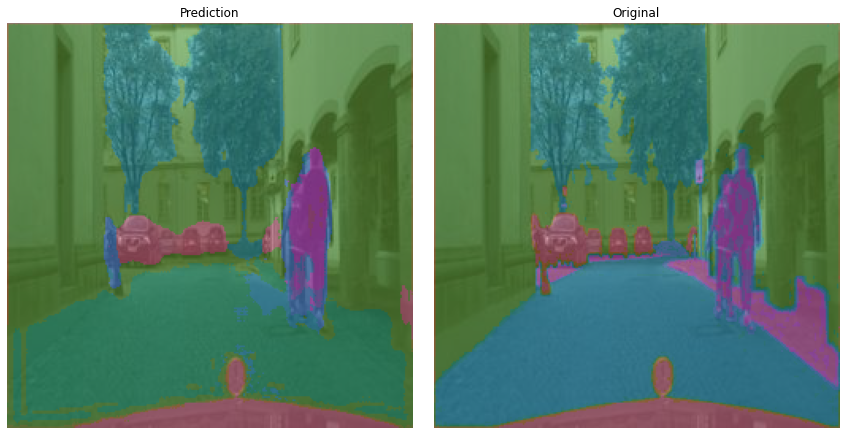

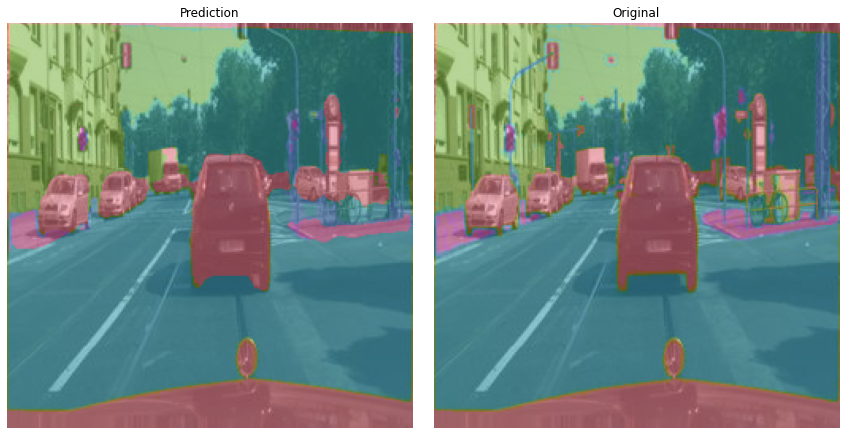

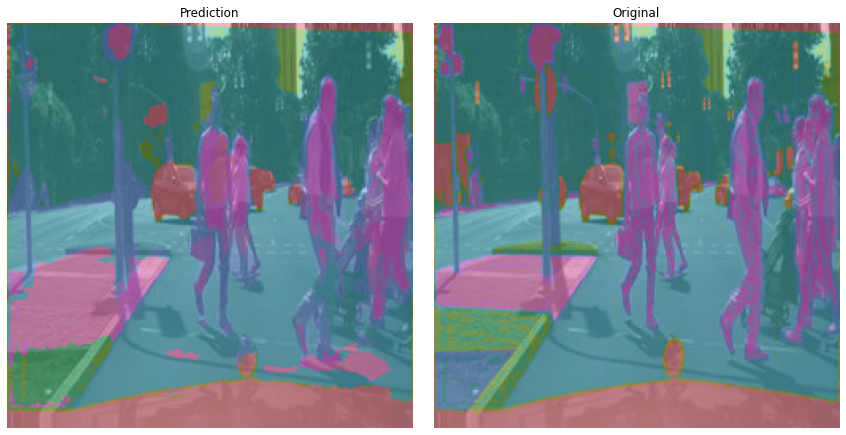

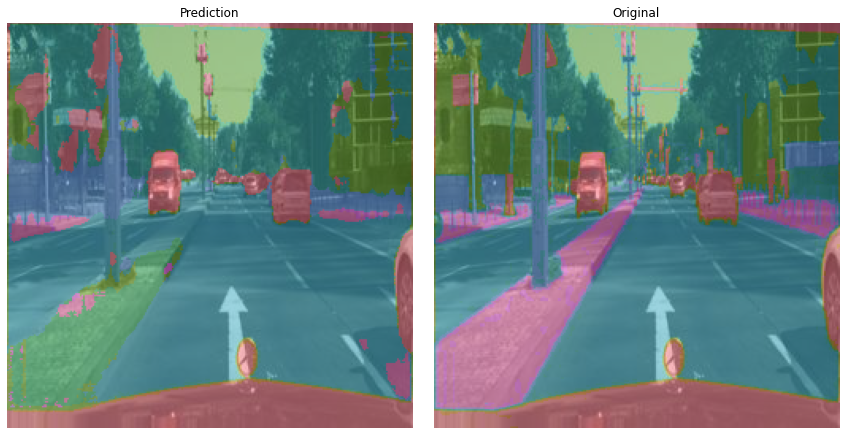

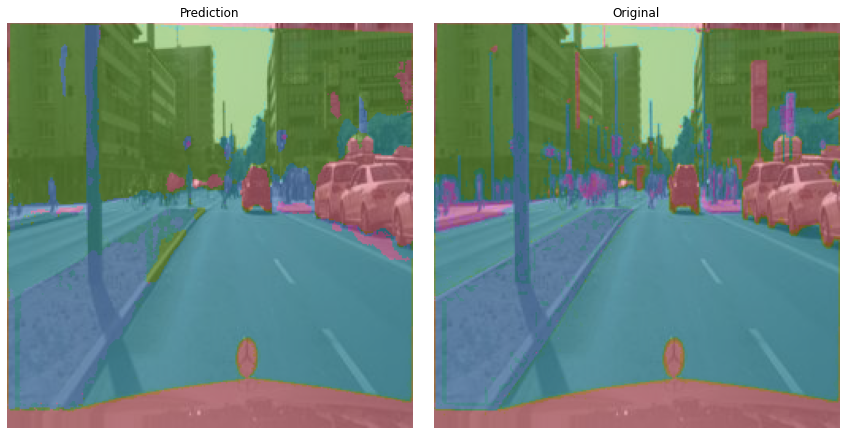

In [38]:
imgs, segs = next(datagen_val)
pred = model2.predict(imgs)

for i in range(10):
    _p = segment_colouring(np.argmax(pred[i], axis=-1))
    _s = segment_colouring(np.argmax(segs[i], axis=-1))

    predimg = cv2.addWeighted(imgs[i]/255, 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[i]/255, 0.5, _s, 0.5, 0)
    
    plt.figure(figsize=(12,6))
    plt.subplot(121)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    plt.subplot(122)
    plt.title("Original")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()